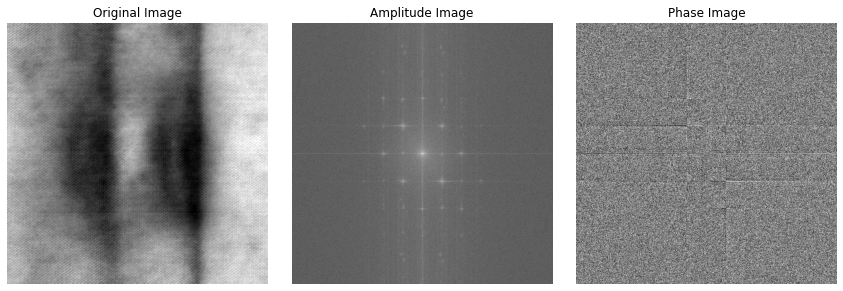

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Function to plot images
def plot_images(original, amplitude, phase):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(original, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(amplitude, cmap='gray')
    plt.title('Amplitude Image')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(phase, cmap='gray')
    plt.title('Phase Image')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Read the image
image_path = '1-g3.png'  # Replace with your image path
image = Image.open(image_path).convert('L')  # Convert to grayscale
image = np.array(image)

# Compute the Fourier transform
F = np.fft.fft2(image)
F_shifted = np.fft.fftshift(F)

# Compute the amplitude and phase
amplitude = np.abs(F_shifted)
phase = np.angle(F_shifted)

# Normalize the amplitude for better visualization
amplitude_log = np.log(1 + amplitude)

# Plot the images
plot_images(image, amplitude_log, phase)


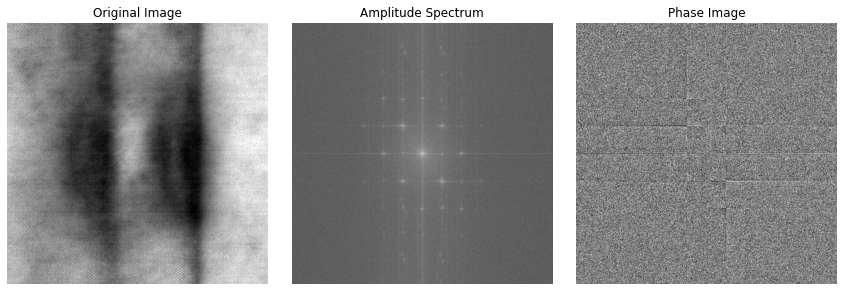

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Function to normalize an image to the range [0, 1]
def normalize(image):
    return (image - np.min(image)) / (np.max(image) - np.min(image))

# Function to plot images
def plot_images(original, amplitude, phase):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(original, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(amplitude, cmap='gray')
    plt.title('Amplitude Spectrum')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(phase, cmap='gray')
    plt.title('Phase Image')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Read the image
image_path = '1-g3.png'  # Replace with your image path
image = Image.open(image_path).convert('L')  # Convert to grayscale
image = np.array(image)

# Compute the Fourier transform
F = np.fft.fft2(image)
F_shifted = np.fft.fftshift(F)

# Compute the amplitude and phase
amplitude = np.abs(F_shifted)
phase = np.angle(F_shifted)

# Enhance the amplitude spectrum
amplitude_log = np.log(1 + amplitude)
amplitude_normalized = normalize(amplitude_log)

# Normalize the phase image
phase_normalized = normalize(phase)

# Plot the images
plot_images(image, amplitude_normalized, phase_normalized)


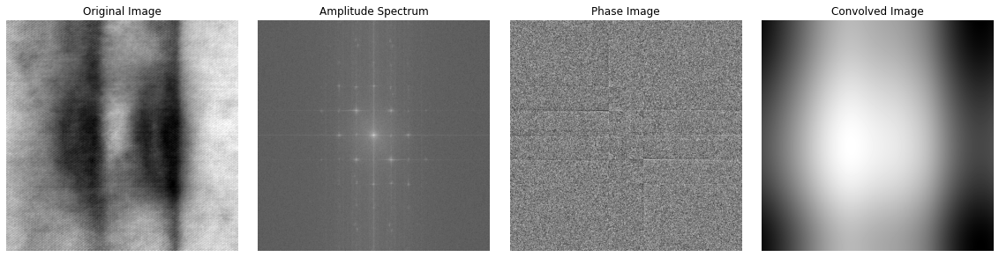

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Function to normalize an image to the range [0, 1]
def normalize(image):
    return (image - np.min(image)) / (np.max(image) - np.min(image))

# Function to plot images
def plot_images(original, amplitude, phase, convolved):
    plt.figure(figsize=(16, 4))

    plt.subplot(1, 4, 1)
    plt.imshow(original, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.imshow(amplitude, cmap='gray')
    plt.title('Amplitude Spectrum')
    plt.axis('off')

    plt.subplot(1, 4, 3)
    plt.imshow(phase, cmap='gray')
    plt.title('Phase Image')
    plt.axis('off')

    plt.subplot(1, 4, 4)
    plt.imshow(convolved, cmap='gray')
    plt.title('Convolved Image')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Read the image
image_path = '1-g3.png'  # Replace with your image path
image = Image.open(image_path).convert('L')  # Convert to grayscale
image = np.array(image)

# Compute the Fourier transform
F = np.fft.fft2(image)
F_shifted = np.fft.fftshift(F)

# Compute the amplitude and phase
amplitude = np.abs(F_shifted)
phase = np.angle(F_shifted)

# Enhance the amplitude spectrum
amplitude_log = np.log(1 + amplitude)
amplitude_normalized = normalize(amplitude_log)

# Normalize the phase image
phase_normalized = normalize(phase)

# Create a Gaussian filter
def gaussian_filter(size, sigma):
    x, y = np.meshgrid(np.linspace(-1,1,size), np.linspace(-1,1,size))
    d = np.sqrt(x*x + y*y)
    g = np.exp(-(d**2 / (2.0 * sigma**2)))
    return g

filter_size = image.shape[0]
sigma = 10
gaussian = gaussian_filter(filter_size, sigma)

# Compute the Fourier transform of the filter
G = np.fft.fft2(gaussian)
G_shifted = np.fft.fftshift(G)

# Multiply the Fourier transforms (convolution in the spatial domain)
F_filtered = F_shifted * G_shifted

# Compute the inverse Fourier transform to get the convolved image
convolved_image = np.fft.ifft2(np.fft.ifftshift(F_filtered))
convolved_image = np.abs(convolved_image)

# Plot the images
plot_images(image, amplitude_normalized, phase_normalized, normalize(convolved_image))


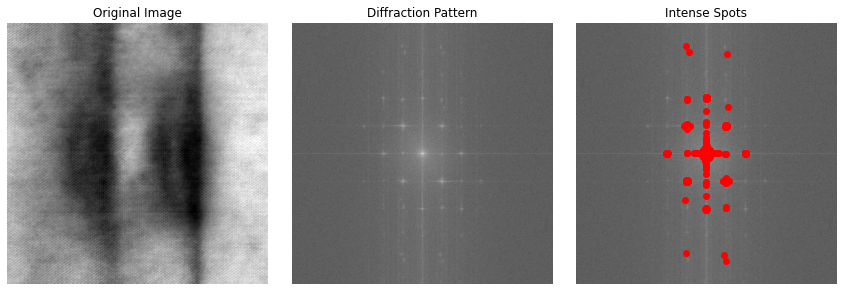

Coordinates of intense spots:
(81, 394)
(104, 403)
(110, 540)
(264, 466)
(265, 466)
(265, 467)
(266, 466)
(266, 467)
(267, 466)
(267, 467)
(267, 468)
(268, 467)
(269, 465)
(269, 466)
(269, 467)
(269, 468)
(269, 469)
(270, 396)
(270, 466)
(271, 396)
(271, 467)
(272, 396)
(273, 396)
(301, 542)
(315, 466)
(354, 466)
(356, 466)
(359, 397)
(362, 397)
(363, 397)
(363, 536)
(364, 394)
(364, 395)
(364, 397)
(364, 537)
(365, 393)
(365, 394)
(365, 395)
(365, 397)
(365, 398)
(365, 400)
(365, 466)
(365, 535)
(365, 536)
(365, 537)
(366, 392)
(366, 393)
(366, 394)
(366, 395)
(366, 396)
(366, 397)
(366, 398)
(366, 399)
(366, 400)
(366, 403)
(366, 405)
(366, 535)
(366, 536)
(366, 537)
(366, 539)
(367, 386)
(367, 390)
(367, 391)
(367, 392)
(367, 393)
(367, 394)
(367, 395)
(367, 396)
(367, 397)
(367, 398)
(367, 399)
(367, 400)
(367, 402)
(367, 403)
(367, 404)
(367, 406)
(367, 533)
(367, 535)
(367, 536)
(367, 537)
(367, 538)
(367, 539)
(368, 390)
(368, 392)
(368, 393)
(368, 394)
(368, 395)
(368, 396)
(36

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from scipy.ndimage import label

# Function to normalize an image to the range [0, 1]
def normalize(image):
    return (image - np.min(image)) / (np.max(image) - np.min(image))

# Function to plot images
def plot_images(original, diffraction, spots):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(original, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(diffraction, cmap='gray')
    plt.title('Diffraction Pattern')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(diffraction, cmap='gray')
    for spot in spots:
        plt.plot(spot[1], spot[0], 'ro')
    plt.title('Intense Spots')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Read the image
image_path = '1-g3.png'  # Replace with your image path
image = Image.open(image_path).convert('L')  # Convert to grayscale
image = np.array(image)

# Compute the Fourier transform
F = np.fft.fft2(image)
F_shifted = np.fft.fftshift(F)

# Compute the magnitude (diffraction pattern)
magnitude = np.abs(F_shifted)
magnitude_log = np.log(1 + magnitude)
magnitude_normalized = normalize(magnitude_log)

# Identify the intense spots
threshold = np.percentile(magnitude_normalized, 99.9)  # Adjust the percentile as needed
intense_spots = magnitude_normalized > threshold
labeled_spots, num_spots = label(intense_spots)

# Get the coordinates of the intense spots
spots_coordinates = np.column_stack(np.where(labeled_spots > 0))

# Plot the images
plot_images(image, magnitude_normalized, spots_coordinates)

# Print the coordinates of the intense spots
print("Coordinates of intense spots:")
for spot in spots_coordinates:
    print(f"({spot[0]}, {spot[1]})")


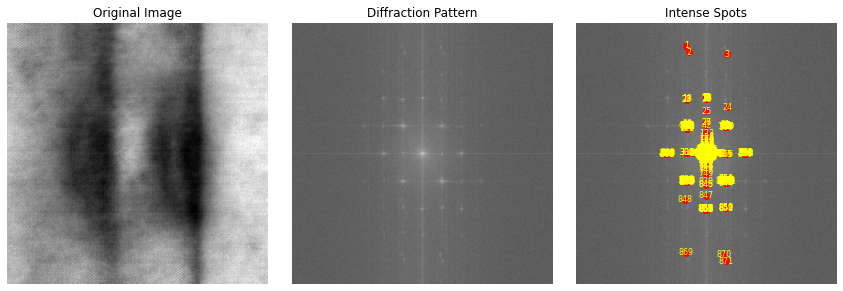

Coordinates of intense spots:
Spot 1: (81, 394)
Spot 2: (104, 403)
Spot 3: (110, 540)
Spot 4: (264, 466)
Spot 5: (265, 466)
Spot 6: (265, 467)
Spot 7: (266, 466)
Spot 8: (266, 467)
Spot 9: (267, 466)
Spot 10: (267, 467)
Spot 11: (267, 468)
Spot 12: (268, 467)
Spot 13: (269, 465)
Spot 14: (269, 466)
Spot 15: (269, 467)
Spot 16: (269, 468)
Spot 17: (269, 469)
Spot 18: (270, 396)
Spot 19: (270, 466)
Spot 20: (271, 396)
Spot 21: (271, 467)
Spot 22: (272, 396)
Spot 23: (273, 396)
Spot 24: (301, 542)
Spot 25: (315, 466)
Spot 26: (354, 466)
Spot 27: (356, 466)
Spot 28: (359, 397)
Spot 29: (362, 397)
Spot 30: (363, 397)
Spot 31: (363, 536)
Spot 32: (364, 394)
Spot 33: (364, 395)
Spot 34: (364, 397)
Spot 35: (364, 537)
Spot 36: (365, 393)
Spot 37: (365, 394)
Spot 38: (365, 395)
Spot 39: (365, 397)
Spot 40: (365, 398)
Spot 41: (365, 400)
Spot 42: (365, 466)
Spot 43: (365, 535)
Spot 44: (365, 536)
Spot 45: (365, 537)
Spot 46: (366, 392)
Spot 47: (366, 393)
Spot 48: (366, 394)
Spot 49: (366, 395)


In [5]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from scipy.ndimage import label

# Function to normalize an image to the range [0, 1]
def normalize(image):
    return (image - np.min(image)) / (np.max(image) - np.min(image))

# Function to plot images
def plot_images(original, diffraction, spots):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(original, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(diffraction, cmap='gray')
    plt.title('Diffraction Pattern')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(diffraction, cmap='gray')
    for idx, spot in enumerate(spots):
        plt.plot(spot[1], spot[0], 'ro')
        plt.text(spot[1], spot[0], f'{idx+1}', color='yellow', fontsize=8, ha='center', va='center')
    plt.title('Intense Spots')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Read the image
image_path = '1-g3.png'  # Replace with your image path
image = Image.open(image_path).convert('L')  # Convert to grayscale
image = np.array(image)

# Compute the Fourier transform
F = np.fft.fft2(image)
F_shifted = np.fft.fftshift(F)

# Compute the magnitude (diffraction pattern)
magnitude = np.abs(F_shifted)
magnitude_log = np.log(1 + magnitude)
magnitude_normalized = normalize(magnitude_log)

# Identify the intense spots
threshold = np.percentile(magnitude_normalized, 99.9)  # Adjust the percentile as needed
intense_spots = magnitude_normalized > threshold
labeled_spots, num_spots = label(intense_spots)

# Get the coordinates of the intense spots
spots_coordinates = np.column_stack(np.where(labeled_spots > 0))

# Plot the images
plot_images(image, magnitude_normalized, spots_coordinates)

# Print the coordinates of the intense spots
print("Coordinates of intense spots:")
for idx, spot in enumerate(spots_coordinates):
    print(f"Spot {idx + 1}: ({spot[0]}, {spot[1]})")


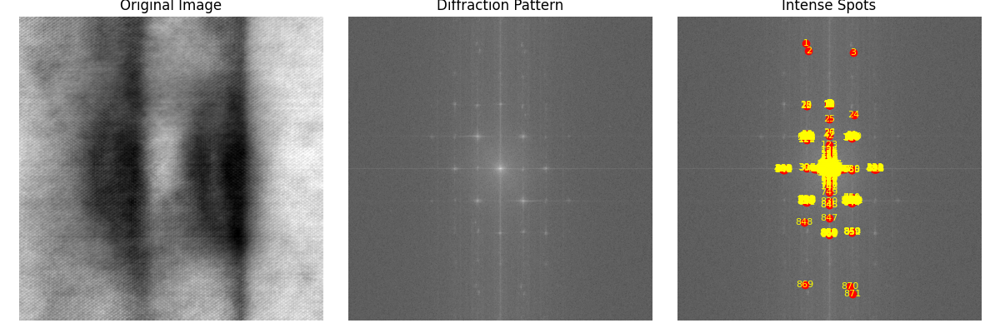

Coordinates of intense spots:
Spot 1: (81, 394)
Spot 2: (104, 403)
Spot 3: (110, 540)
Spot 4: (264, 466)
Spot 5: (265, 466)
Spot 6: (265, 467)
Spot 7: (266, 466)
Spot 8: (266, 467)
Spot 9: (267, 466)
Spot 10: (267, 467)
Spot 11: (267, 468)
Spot 12: (268, 467)
Spot 13: (269, 465)
Spot 14: (269, 466)
Spot 15: (269, 467)
Spot 16: (269, 468)
Spot 17: (269, 469)
Spot 18: (270, 396)
Spot 19: (270, 466)
Spot 20: (271, 396)
Spot 21: (271, 467)
Spot 22: (272, 396)
Spot 23: (273, 396)
Spot 24: (301, 542)
Spot 25: (315, 466)
Spot 26: (354, 466)
Spot 27: (356, 466)
Spot 28: (359, 397)
Spot 29: (362, 397)
Spot 30: (363, 397)
Spot 31: (363, 536)
Spot 32: (364, 394)
Spot 33: (364, 395)
Spot 34: (364, 397)
Spot 35: (364, 537)
Spot 36: (365, 393)
Spot 37: (365, 394)
Spot 38: (365, 395)
Spot 39: (365, 397)
Spot 40: (365, 398)
Spot 41: (365, 400)
Spot 42: (365, 466)
Spot 43: (365, 535)
Spot 44: (365, 536)
Spot 45: (365, 537)
Spot 46: (366, 392)
Spot 47: (366, 393)
Spot 48: (366, 394)
Spot 49: (366, 395)


In [6]:
%matplotlib widget
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from scipy.ndimage import label

# Function to normalize an image to the range [0, 1]
def normalize(image):
    return (image - np.min(image)) / (np.max(image) - np.min(image))

# Function to plot images
def plot_images(original, diffraction, spots):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(original, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(diffraction, cmap='gray')
    plt.title('Diffraction Pattern')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(diffraction, cmap='gray')
    for idx, spot in enumerate(spots):
        plt.plot(spot[1], spot[0], 'ro')
        plt.text(spot[1], spot[0], f'{idx+1}', color='yellow', fontsize=8, ha='center', va='center')
    plt.title('Intense Spots')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Read the image
image_path = '1-g3.png'  # Replace with your image path
image = Image.open(image_path).convert('L')  # Convert to grayscale
image = np.array(image)

# Compute the Fourier transform
F = np.fft.fft2(image)
F_shifted = np.fft.fftshift(F)

# Compute the magnitude (diffraction pattern)
magnitude = np.abs(F_shifted)
magnitude_log = np.log(1 + magnitude)
magnitude_normalized = normalize(magnitude_log)

# Identify the intense spots
threshold = np.percentile(magnitude_normalized, 99.9)  # Adjust the percentile as needed
intense_spots = magnitude_normalized > threshold
labeled_spots, num_spots = label(intense_spots)

# Get the coordinates of the intense spots
spots_coordinates = np.column_stack(np.where(labeled_spots > 0))

# Plot the images
plot_images(image, magnitude_normalized, spots_coordinates)

# Print the coordinates of the intense spots
print("Coordinates of intense spots:")
for idx, spot in enumerate(spots_coordinates):
    print(f"Spot {idx + 1}: ({spot[0]}, {spot[1]})")


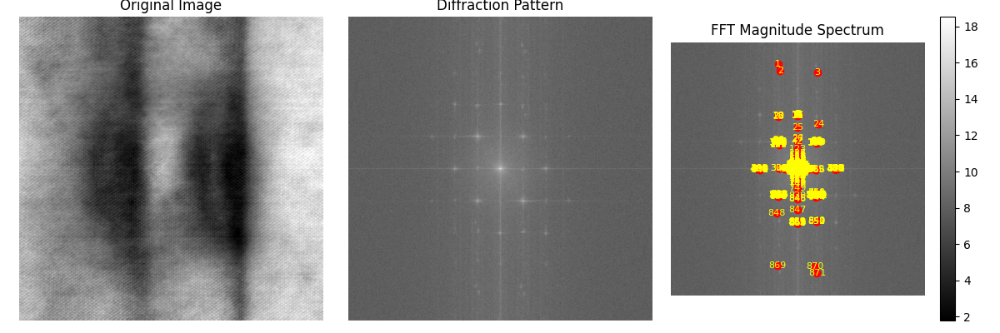

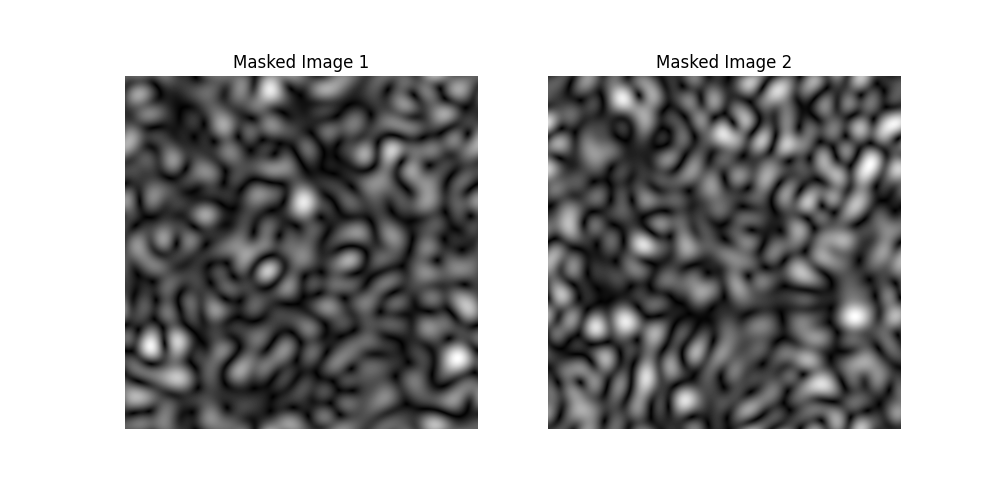

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage
from PIL import Image

# Read the image and convert to grayscale
image_path = '1-g3.png'  # Replace with your image path
image = Image.open(image_path).convert('L')
image = np.array(image)

# Compute the Fourier transform
fft = np.fft.fft2(image)
fft_shifted = np.fft.fftshift(fft)
magnitude_spectrum = np.abs(fft_shifted)

# Visualize the FFT magnitude spectrum
plt.imshow(np.log(1 + magnitude_spectrum), cmap='gray')
plt.title('FFT Magnitude Spectrum')
plt.colorbar()
plt.show()

# Select reciprocal lattice vectors g1 and g2 (you need to manually select them)
g1 = (100, 100)  # Replace with the coordinates of the first peak
g2 = (150, 150)  # Replace with the coordinates of the second peak

# Create circular masks centered at g1 and g2
radius = 10  # Adjust the radius as needed
mask1 = np.zeros_like(magnitude_spectrum)
mask2 = np.zeros_like(magnitude_spectrum)
y, x = np.ogrid[:mask1.shape[0], :mask1.shape[1]]
mask1[(x - g1[1])**2 + (y - g1[0])**2 <= radius**2] = 1
mask2[(x - g2[1])**2 + (y - g2[0])**2 <= radius**2] = 1

# Apply the masks to the FFT
fft_masked1 = fft_shifted * mask1
fft_masked2 = fft_shifted * mask2

# Compute the inverse FFT to obtain the masked images
image_masked1 = np.abs(np.fft.ifft2(np.fft.ifftshift(fft_masked1)))
image_masked2 = np.abs(np.fft.ifft2(np.fft.ifftshift(fft_masked2)))

# Visualize the masked images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image_masked1, cmap='gray')
plt.title('Masked Image 1')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(image_masked2, cmap='gray')
plt.title('Masked Image 2')
plt.axis('off')

plt.show()


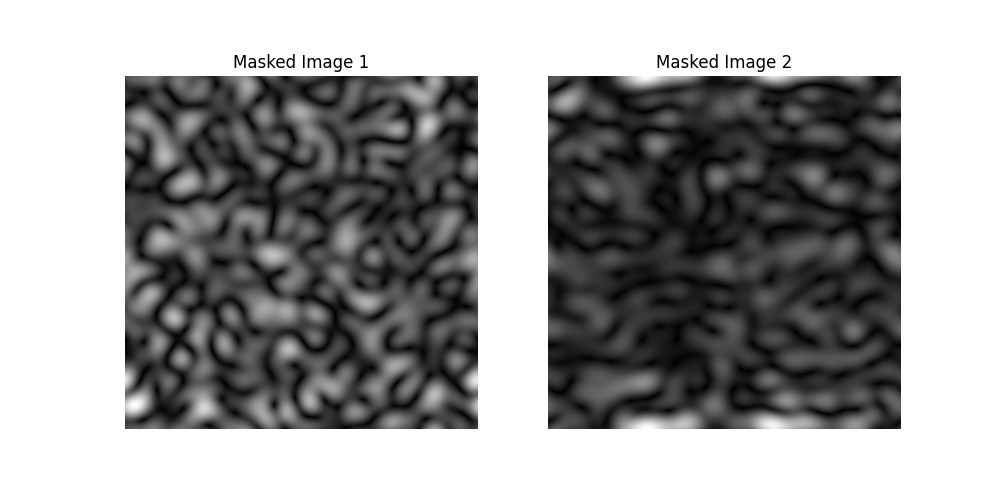

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def apply_mask_and_inverse_fft(image, g1, g2):
    # Compute the Fourier transform
    fft = np.fft.fft2(image)
    fft_shifted = np.fft.fftshift(fft)

    # Create circular masks centered at g1 and g2
    radius = 10  # Adjust the radius as needed
    y, x = np.ogrid[:fft_shifted.shape[0], :fft_shifted.shape[1]]
    mask1 = np.zeros_like(fft_shifted)
    mask1[(x - g1[1])**2 + (y - g1[0])**2 <= radius**2] = 1
    mask2 = np.zeros_like(fft_shifted)
    mask2[(x - g2[1])**2 + (y - g2[0])**2 <= radius**2] = 1

    # Apply the masks to the FFT
    fft_masked1 = fft_shifted * mask1
    fft_masked2 = fft_shifted * mask2

    # Compute the inverse FFT to obtain the masked images
    image_masked1 = np.abs(np.fft.ifft2(np.fft.ifftshift(fft_masked1)))
    image_masked2 = np.abs(np.fft.ifft2(np.fft.ifftshift(fft_masked2)))

    return image_masked1, image_masked2

# Read the image and convert to grayscale
image_path = '1-g3.png'  # Replace with your image path
image = Image.open(image_path).convert('L')
image = np.array(image)

# Example reciprocal lattice vectors (you need to provide these)
g1 = (535, 361)
g2 = (604, 464)

# Apply mask and compute inverse FFT
masked_image1, masked_image2 = apply_mask_and_inverse_fft(image, g1, g2)

# Visualize the masked images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(masked_image1, cmap='gray')
plt.title('Masked Image 1')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(masked_image2, cmap='gray')
plt.title('Masked Image 2')
plt.axis('off')

plt.show()


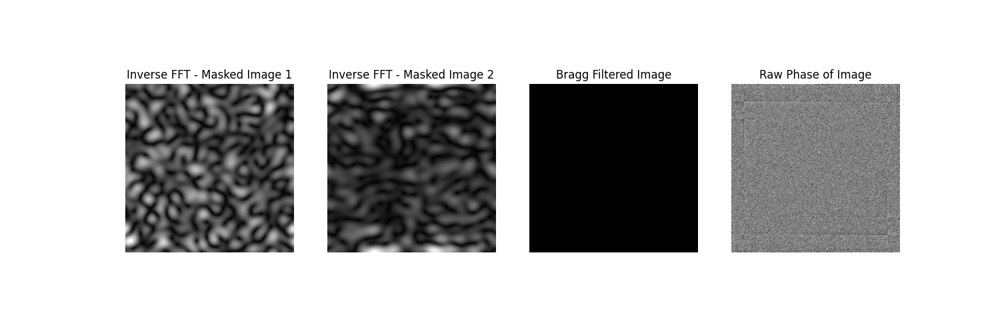

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def apply_mask_and_inverse_fft(image, g1, g2):
    # Compute the Fourier transform
    fft = np.fft.fft2(image)
    fft_shifted = np.fft.fftshift(fft)

    # Create circular masks centered at g1 and g2
    radius = 10  # Adjust the radius as needed
    y, x = np.ogrid[:fft_shifted.shape[0], :fft_shifted.shape[1]]
    mask1 = np.zeros_like(fft_shifted)
    mask1[(x - g1[1])**2 + (y - g1[0])**2 <= radius**2] = 1
    mask2 = np.zeros_like(fft_shifted)
    mask2[(x - g2[1])**2 + (y - g2[0])**2 <= radius**2] = 1

    # Apply the masks to the FFT
    fft_masked1 = fft_shifted * mask1
    fft_masked2 = fft_shifted * mask2

    # Compute the inverse FFT to obtain the masked images
    image_masked1 = np.abs(np.fft.ifft2(np.fft.ifftshift(fft_masked1)))
    image_masked2 = np.abs(np.fft.ifft2(np.fft.ifftshift(fft_masked2)))

    return image_masked1, image_masked2

# Read the image and convert to grayscale
image_path = '1-g3.png'  # Replace with your image path
image = Image.open(image_path).convert('L')
image = np.array(image)

# Example reciprocal lattice vectors (you need to provide these)
g1 = (535, 361)
g2 = (604, 464)


# Apply mask and compute inverse FFT
masked_image1, masked_image2 = apply_mask_and_inverse_fft(image, g1, g2)

# Compute the phase of the original image
phase_image = np.angle(image)

# Compute the raw phase of the image after applying FFT
fft_image = np.fft.fft2(image)
raw_phase_image = np.angle(fft_image)

# Plotting
plt.figure(figsize=(15, 5))

plt.subplot(1, 4, 1)
plt.imshow(np.abs(masked_image1), cmap='gray')
plt.title('Inverse FFT - Masked Image 1')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(np.abs(masked_image2), cmap='gray')
plt.title('Inverse FFT - Masked Image 2')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(np.abs(fft_image), cmap='gray')
plt.title('Bragg Filtered Image')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(raw_phase_image, cmap='gray')
plt.title('Raw Phase of Image')
plt.axis('off')

plt.show()


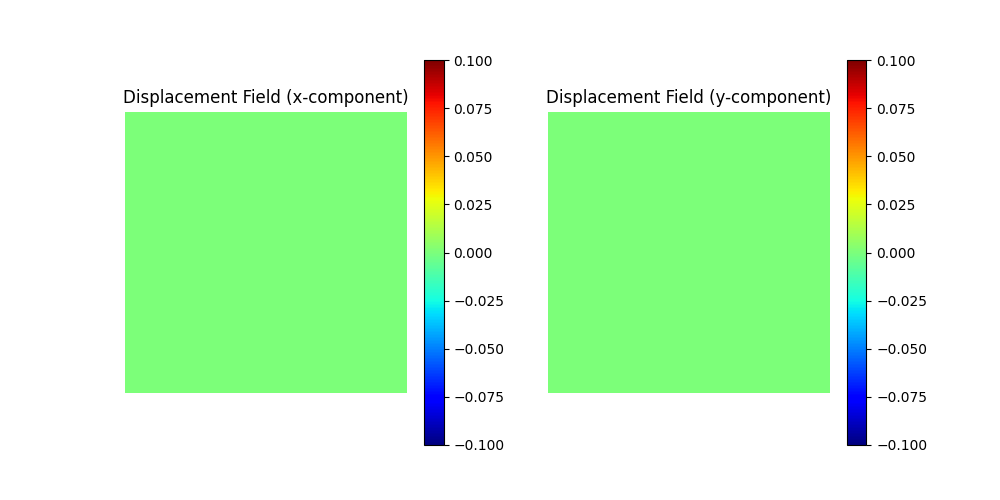

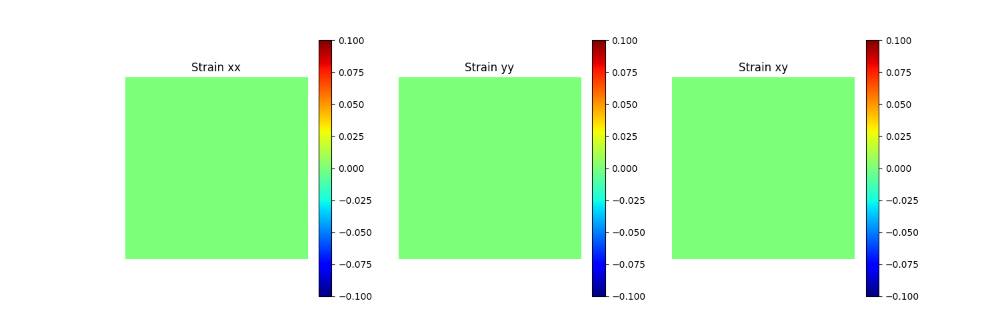

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def calculate_displacement(phase_image, g1, g2):
    # Calculate the reciprocal lattice vectors
    g1_vector = np.array(g1)
    g2_vector = np.array(g2)
    
    # Calculate the phase gradient
    grad_x, grad_y = np.gradient(phase_image)
    
    # Calculate the displacement field
    displacement_x = (grad_y * g2_vector[0] - grad_x * g2_vector[1]) / (g1_vector[0] * g2_vector[1] - g1_vector[1] * g2_vector[0])
    displacement_y = (grad_x * g1_vector[1] - grad_y * g1_vector[0]) / (g1_vector[0] * g2_vector[1] - g1_vector[1] * g2_vector[0])
    
    return displacement_x, displacement_y

def calculate_strain(displacement_x, displacement_y):
    # Calculate the strain tensor components
    strain_xx = np.gradient(displacement_x)[1]
    strain_yy = np.gradient(displacement_y)[0]
    strain_xy = 0.5 * (np.gradient(displacement_x)[0] + np.gradient(displacement_y)[1])
    
    return strain_xx, strain_yy, strain_xy

# Read the image and convert to grayscale
image_path = '1-g3.png'  # Replace with your image path
image = Image.open(image_path).convert('L')
image = np.array(image)

# Example reciprocal lattice vectors (you need to provide these)
g1 = (535, 361)
g2 = (604, 464)


# Calculate the phase of the original image
phase_image = np.angle(image)

# Calculate the displacement field
displacement_x, displacement_y = calculate_displacement(phase_image, g1, g2)

# Calculate the strain tensor components
strain_xx, strain_yy, strain_xy = calculate_strain(displacement_x, displacement_y)

# Plotting displacement field
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(displacement_x, cmap='jet')
plt.title('Displacement Field (x-component)')
plt.colorbar()
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(displacement_y, cmap='jet')
plt.title('Displacement Field (y-component)')
plt.colorbar()
plt.axis('off')

plt.show()

# Plotting strain tensor components
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(strain_xx, cmap='jet')
plt.title('Strain xx')
plt.colorbar()
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(strain_yy, cmap='jet')
plt.title('Strain yy')
plt.colorbar()
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(strain_xy, cmap='jet')
plt.title('Strain xy')
plt.colorbar()
plt.axis('off')

plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


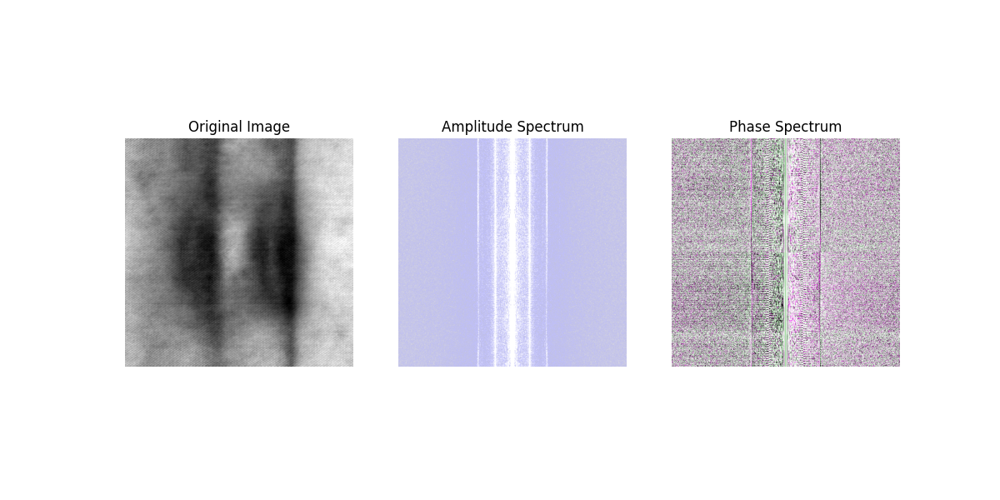

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft2, fftshift

# Load an image (for example purposes, we'll use a sample image from matplotlib)
image = plt.imread("1-g3.png")  # Replace 'sample_image.png' with your image file

# Compute the 2D Fourier Transform of the image
fft_image = fft2(image)
fft_image_shifted = fftshift(fft_image)  # Shift zero frequency component to the center

# Compute the amplitude and phase
amplitude = np.abs(fft_image_shifted)
phase = np.angle(fft_image_shifted)

# Plot the original image, amplitude, and phase
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(image, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("Amplitude Spectrum")
plt.imshow(np.log(amplitude + 1), cmap='gray')  # Log scale for better visualization
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title("Phase Spectrum")
plt.imshow(phase, cmap='gray')
plt.axis('off')

plt.show()


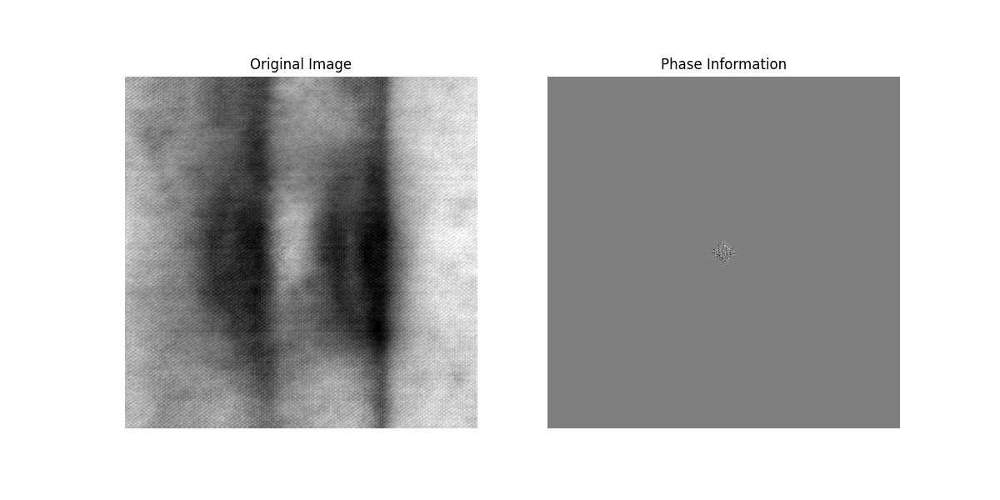

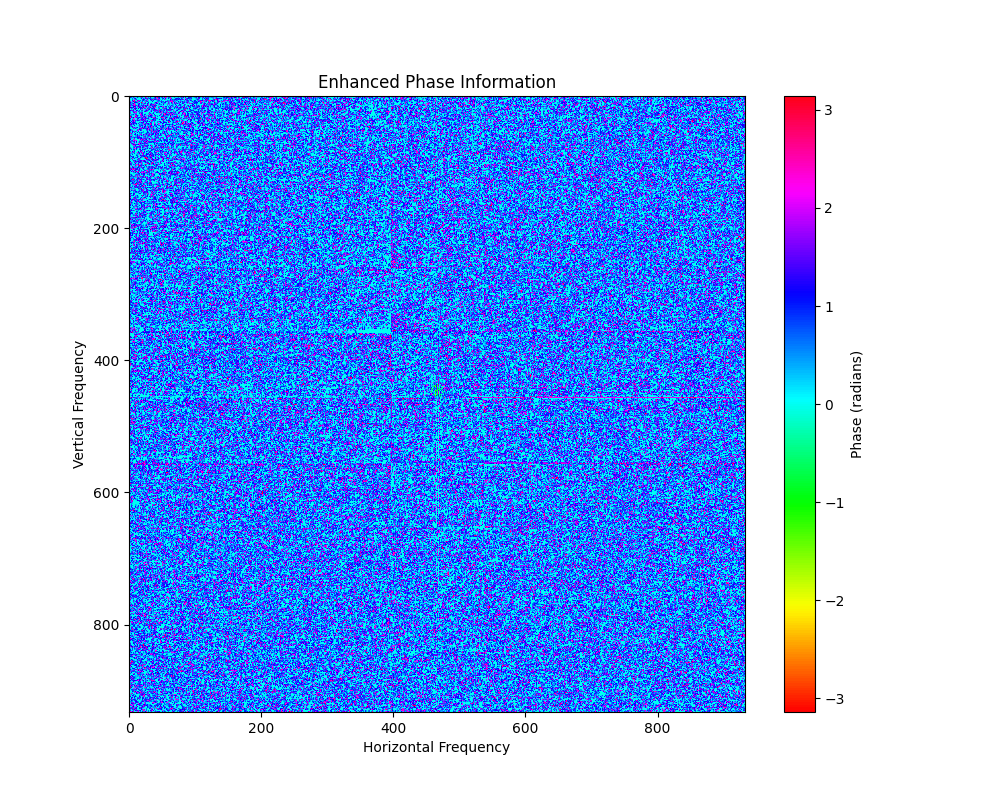

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft2, fftshift, ifftshift

# Load an image (replace 'path_to_image' with the actual image path)
image = plt.imread("1-g3.png")  # Ensure the image is in grayscale or convert it if necessary
if image.ndim == 3:
    image = image[..., 0]  # Convert to grayscale if it is an RGB image

# Compute the 2D Fourier Transform of the image
fft_image = fft2(image)
fft_image_shifted = fftshift(fft_image)  # Shift zero frequency component to the center

# Define the Bragg position vectors (u) based on the periodicities corresponding to Bragg reflections
# For demonstration, assume some example Bragg positions; these need to be provided or computed based on the specific case
bragg_positions = [
    (10, 0),  # Example positions; replace with actual Bragg reflection coordinates
    (-10, 0),
    (0, 10),
    (0, -10)
]

# Define the Masking Function M(k)
def mask_function(shape, bragg_pos, k_radius):
    mask = np.zeros(shape, dtype=np.float32)
    kx_center, ky_center = shape[1] // 2, shape[0] // 2
    for kx, ky in bragg_pos:
        kx_grid, ky_grid = np.meshgrid(np.arange(shape[1]), np.arange(shape[0]))
        distance = np.sqrt((kx_grid - (kx_center + kx))**2 + (ky_grid - (ky_center + ky))**2)
        mask += np.where(distance <= k_radius, 1, 0)
    return mask

# Define the radius of the first Brillouin zone (needs to be set appropriately)
k_radius = 10  # Example value, adjust as needed

# Apply the masking function
mask = mask_function(fft_image_shifted.shape, bragg_positions, k_radius)
masked_fft_image = fft_image_shifted * mask

# Extract local Fourier components I_g(k) using the equation I_g(k) = I(k + u) M(k)
local_fourier_components = np.zeros_like(masked_fft_image, dtype=np.complex64)
for kx, ky in bragg_positions:
    local_fourier_components += np.roll(masked_fft_image, shift=(ky, kx), axis=(0, 1))

# Extract phase information from the local Fourier components
phase = np.angle(local_fourier_components)

# Plot the original image and the phase information
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(image, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Phase Information")
plt.imshow(phase, cmap='gray')
plt.axis('off')

plt.show()

import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft2, fftshift

# Load an image (replace 'path_to_image' with the actual image path)
image = plt.imread("1-g3.png")  # Ensure the image is in grayscale or convert it if necessary
if image.ndim == 3:
    image = image[..., 0]  # Convert to grayscale if it is an RGB image

# Compute the 2D Fourier Transform of the image
fft_image = fft2(image)
fft_image_shifted = fftshift(fft_image)  # Shift zero frequency component to the center

# Define the Bragg position vector u
u = np.array([kx, ky])  # Replace kx and ky with actual Bragg position coordinates

# Define the Masking Function M(k)
def mask_function(shape, bragg_pos, k_radius):
    mask = np.zeros(shape, dtype=np.float32)
    kx_center, ky_center = shape[1] // 2, shape[0] // 2
    for kx, ky in bragg_pos:
        kx_grid, ky_grid = np.meshgrid(np.arange(shape[1]), np.arange(shape[0]))
        distance = np.sqrt((kx_grid - (kx_center + kx))**2 + (ky_grid - (ky_center + ky))**2)
        mask += np.where(distance <= k_radius, 1, 0)
    return mask

# Define the radius of the first Brillouin zone (needs to be set appropriately)
k_radius = 10  # Example value, adjust as needed

# Apply the masking function
mask = mask_function(fft_image_shifted.shape, [u], k_radius)
masked_fft_image = fft_image_shifted * mask

# Extract local Fourier components I_g(k) using the equation I_g(k) = I(k + u) M(k)
local_fourier_components = np.roll(masked_fft_image, shift=(u[1], u[0]), axis=(0, 1))

# Extract phase information from the local Fourier components
phase = np.angle(local_fourier_components)

# Plot the phase information with enhanced details
plt.figure(figsize=(10, 8))
plt.title("Enhanced Phase Information")
plt.imshow(phase, cmap='hsv')  # Use 'hsv' colormap for better phase visualization
plt.colorbar(label='Phase (radians)')
plt.xlabel('Horizontal Frequency')
plt.ylabel('Vertical Frequency')
plt.grid(False)
plt.show()


Indices of bright spots in the power spectrum:
Spot at (466, 466)


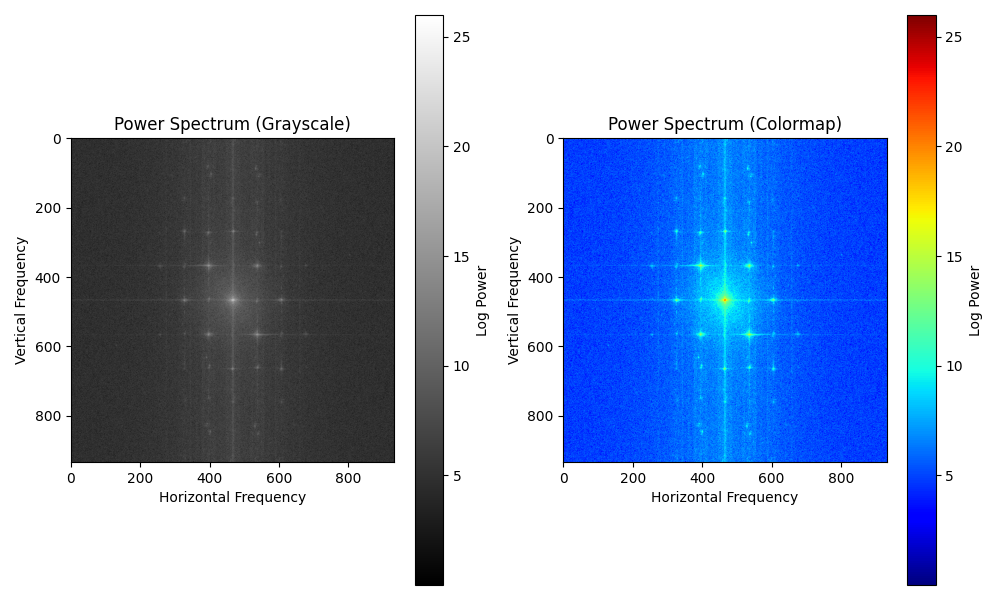

In [14]:
%matplotlib widget
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft2, fftshift

# Load the image
image = plt.imread('1-g3.png')  

# Ensure the image is in grayscale or convert it if necessary
if image.ndim == 3:
    image = image[..., 0]  

# Compute the 2D Fourier Transform of the image
fft_image = fft2(image)
fft_image_shifted = fftshift(fft_image)  # Shift zero frequency component to the center

# Compute the squared magnitude of the Fourier transform to obtain the power spectrum
power_spectrum = np.abs(fft_image_shifted)**2

# Find bright spots in the power spectrum (defined as pixels with values above a certain threshold)
threshold = 0.5 * np.max(power_spectrum)  # Adjust threshold as needed
bright_spots_indices = np.where(power_spectrum > threshold)

# Plot grayscale representation of the power spectrum
plt.figure(figsize=(10, 6))
plt.subplot(1, 2, 1)
plt.title("Power Spectrum (Grayscale)")
plt.imshow(np.log(power_spectrum + 1), cmap='gray')  # Log scale for better visualization
plt.xlabel('Horizontal Frequency')
plt.ylabel('Vertical Frequency')
plt.colorbar(label='Log Power')
plt.grid(False)

# Plot color map representation of the power spectrum
plt.subplot(1, 2, 2)
plt.title("Power Spectrum (Colormap)")
plt.imshow(np.log(power_spectrum + 1), cmap='jet')  # Using 'jet' colormap for color representation
plt.xlabel('Horizontal Frequency')
plt.ylabel('Vertical Frequency')
plt.colorbar(label='Log Power')
plt.grid(False)

# Print the indices of all bright spots in the power spectrum
print("Indices of bright spots in the power spectrum:")
for i, j in zip(*bright_spots_indices):
    print(f"Spot at ({i}, {j})")

plt.tight_layout()
plt.show()


In [20]:
import numpy as np

# Load the image
image = plt.imread('1716 20240323 STEM 2.2 Mx Nano Diffraction BF BF.png')  

# Ensure the image is in grayscale or convert it if necessary
if image.ndim == 3:
    image = image[..., 0]  

# Compute the 2D Fourier Transform of the image
fft_image = fft2(image)
fft_image_shifted = fftshift(fft_image)  # Shift zero frequency component to the center

# Define the coordinates for the two most intense spots in the power spectrum
g1 = (512, 660)
g2 = (620, 586)

# Define the size of the Gaussian mask
mask_size = 30

# Define Gaussian masks centered at the coordinates corresponding to the G vectors
x, y = np.meshgrid(np.arange(image.shape[1]), np.arange(image.shape[0]))
mask1 = np.exp(-((x - g1[1])**2 + (y - g1[0])**2) / (2 * mask_size**2))
mask2 = np.exp(-((x - g2[1])**2 + (y - g2[0])**2) / (2 * mask_size**2))

# Apply the Gaussian masks to the Fourier-transformed image to create masked images
masked_fft_image1 = fft_image_shifted * mask1
masked_fft_image2 = fft_image_shifted * mask2

# Perform inverse Fourier transform to obtain complex images
complex_image1 = ifftshift(ifft2(ifftshift(masked_fft_image1)))
complex_image2 = ifftshift(ifft2(ifftshift(masked_fft_image2)))

# Calculate Bragg filtered images
B1 = 2 * np.real(complex_image1)
B2 = 2 * np.real(complex_image2)

# Calculate phase images
Pg1 = np.angle(complex_image1) - 2*np.pi*(g1[1]*x + g1[0]*y)
Pg2 = np.angle(complex_image2) - 2*np.pi*(g2[1]*x + g2[0]*y)

# Calculate raw phase images
Pp1 = np.angle(complex_image1)
Pp2 = np.angle(complex_image2)

# Plot the resulting images for both G vectors separately
plt.figure(figsize=(16, 8))

plt.subplot(2, 4, 1)
plt.title("Masked Image (G1)")
plt.imshow(np.abs(masked_fft_image1), cmap='gray')
plt.axis('off')

plt.subplot(2, 4, 2)
plt.title("Masked Image (G2)")
plt.imshow(np.abs(masked_fft_image2), cmap='gray')
plt.axis('off')

plt.subplot(2, 4, 3)
plt.title("Bragg Filtered Image (G1)")
plt.imshow(B1, cmap='gray')
plt.axis('off')

plt.subplot(2, 4, 4)
plt.title("Bragg Filtered Image (G2)")
plt.imshow(B2, cmap='gray')
plt.axis('off')

plt.subplot(2, 4, 5)
plt.title("Phase Image (G1)")
plt.imshow(Pg1, cmap='hsv')
plt.colorbar(label='Phase (radians)')
plt.axis('off')

plt.subplot(2, 4, 6)
plt.title("Phase Image (G2)")
plt.imshow(Pg2, cmap='hsv')
plt.colorbar(label='Phase (radians)')
plt.axis('off')

plt.subplot(2, 4, 7)
plt.title("Raw Phase Image (G1)")
plt.imshow(Pp1, cmap='hsv')
plt.colorbar(label='Phase (radians)')
plt.axis('off')

plt.subplot(2, 4, 8)
plt.title("Raw Phase Image (G2)")
plt.imshow(Pp2, cmap='hsv')
plt.colorbar(label='Phase (radians)')
plt.axis('off')

plt.tight_layout()
plt.show()


NameError: name 'ifft2' is not defined

In [21]:
import numpy as np
import cv2
from scipy import ndimage

def preprocess(image):
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Apply Gaussian blur to reduce noise
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    return blurred

def extract_phase(preprocessed_image):
    # Compute gradient using Sobel operator
    sobel_x = cv2.Sobel(preprocessed_image, cv2.CV_64F, 1, 0, ksize=5)
    sobel_y = cv2.Sobel(preprocessed_image, cv2.CV_64F, 0, 1, ksize=5)
    # Compute phase
    phase = np.arctan2(sobel_y, sobel_x)
    return phase

def unwrap_phase(phase):
    return np.unwrap(phase)

def calculate_strain(unwrapped_phase):
    # Calculate strain from the gradient of the unwrapped phase
    strain_x = np.gradient(unwrapped_phase, axis=1)
    strain_y = np.gradient(unwrapped_phase, axis=0)
    return strain_x, strain_y

def main():
    # Load image
    image = cv2.imread('1-g3.png')
    # Preprocess image
    preprocessed_image = preprocess(image)
    # Extract phase
    phase = extract_phase(preprocessed_image)
    # Unwrap phase
    unwrapped_phase = unwrap_phase(phase)
    # Calculate strain
    strain_x, strain_y = calculate_strain(unwrapped_phase)
    # Display strain map or further analysis
    # (e.g., plotting, saving to file, etc.)

if __name__ == "__main__":
    main()


ModuleNotFoundError: No module named 'cv2'

In [23]:
import numpy as np
from scipy import ndimage
import matplotlib.pyplot as plt

def preprocess(image):
    # Convert to grayscale
    gray = np.mean(image, axis=2)
    # Apply Gaussian blur to reduce noise
    blurred = ndimage.gaussian_filter(gray, sigma=1)
    return blurred

def extract_phase(preprocessed_image):
    # Compute gradient using Sobel operator
    sobel_x = ndimage.sobel(preprocessed_image, axis=1)
    sobel_y = ndimage.sobel(preprocessed_image, axis=0)
    # Compute phase
    phase = np.arctan2(sobel_y, sobel_x)
    return phase

def unwrap_phase(phase):
    return np.unwrap(phase)

def calculate_strain(unwrapped_phase):
    # Calculate strain from the gradient of the unwrapped phase
    strain_x = np.gradient(unwrapped_phase, axis=1)
    strain_y = np.gradient(unwrapped_phase, axis=0)
    return strain_x, strain_y

def main():
    # Load image (replace 'your_image.jpg' with the path to your image)
    image = plt.imread('1-g3.png')
    # Preprocess image
    preprocessed_image = preprocess(image)
    # Extract phase
    phase = extract_phase(preprocessed_image)
    # Unwrap phase
    unwrapped_phase = unwrap_phase(phase)
    # Calculate strain
    strain_x, strain_y = calculate_strain(unwrapped_phase)
    # Display strain map or further analysis
    # (e.g., plotting, saving to file, etc.)

if __name__ == "__main__":
    main()


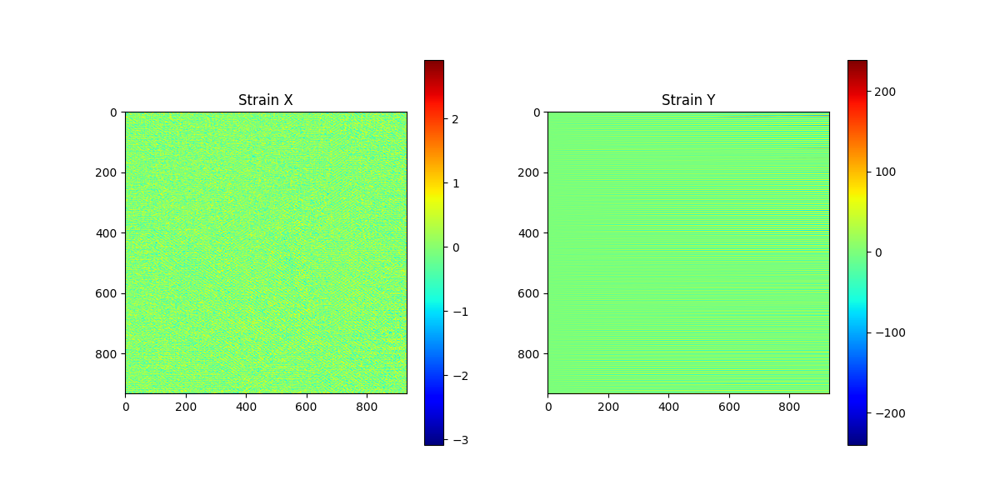

In [24]:
import numpy as np
from scipy import ndimage
import matplotlib.pyplot as plt

def preprocess(image):
    # Convert to grayscale
    gray = np.mean(image, axis=2)
    # Apply Gaussian blur to reduce noise
    blurred = ndimage.gaussian_filter(gray, sigma=1)
    return blurred

def extract_phase(preprocessed_image):
    # Compute gradient using Sobel operator
    sobel_x = ndimage.sobel(preprocessed_image, axis=1)
    sobel_y = ndimage.sobel(preprocessed_image, axis=0)
    # Compute phase
    phase = np.arctan2(sobel_y, sobel_x)
    return phase

def unwrap_phase(phase):
    return np.unwrap(phase)

def calculate_strain(unwrapped_phase):
    # Calculate strain from the gradient of the unwrapped phase
    strain_x = np.gradient(unwrapped_phase, axis=1)
    strain_y = np.gradient(unwrapped_phase, axis=0)
    return strain_x, strain_y

def main():
    # Load image (replace 'your_image.jpg' with the path to your image)
    image = plt.imread('1-g3.png')
    # Preprocess image
    preprocessed_image = preprocess(image)
    # Extract phase
    phase = extract_phase(preprocessed_image)
    # Unwrap phase
    unwrapped_phase = unwrap_phase(phase)
    # Calculate strain
    strain_x, strain_y = calculate_strain(unwrapped_phase)
    
    # Plot strain maps
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(strain_x, cmap='jet')
    plt.title('Strain X')
    plt.colorbar()
    plt.subplot(1, 2, 2)
    plt.imshow(strain_y, cmap='jet')
    plt.title('Strain Y')
    plt.colorbar()
    plt.show()

if __name__ == "__main__":
    main()


In [25]:
import numpy as np
from scipy import ndimage, fft
import matplotlib.pyplot as plt

def preprocess(image):
    # Convert to grayscale
    gray = np.mean(image, axis=2)
    # Apply Gaussian blur to reduce noise
    blurred = ndimage.gaussian_filter(gray, sigma=1)
    return blurred

def extract_phase(preprocessed_image):
    # Compute gradient using Sobel operator
    sobel_x = ndimage.sobel(preprocessed_image, axis=1)
    sobel_y = ndimage.sobel(preprocessed_image, axis=0)
    # Compute phase
    phase = np.arctan2(sobel_y, sobel_x)
    return phase

def select_reference_region(phase):
    # Manually select two points for the reference region
    # Typically, these points are in the same phase region
    # and represent the reference g vectors
    point1 = (535, 361)  # Example coordinate 1
    point2 = (604, 464)  # Example coordinate 2
    g_vector1 = phase[point1[0], point1[1]]
    g_vector2 = phase[point2[0], point2[1]]
    return g_vector1, g_vector2

def compute_g_vectors(g_vector1, g_vector2, phase_shape):
    # Create g vectors
    g1 = np.exp(1j * g_vector1)
    g2 = np.exp(1j * g_vector2)
    # Compute inverse FFT
    g1_ifft = fft.ifft2(g1, s=phase_shape)
    g2_ifft = fft.ifft2(g2, s=phase_shape)
    return g1_ifft, g2_ifft

def calculate_strain(g1_ifft, g2_ifft):
    # Calculate strain in xx and yy direction
    strain_xx = np.real(np.conj(g1_ifft) * g1_ifft)
    strain_yy = np.real(np.conj(g2_ifft) * g2_ifft)
    return strain_xx, strain_yy

def main():
    # Load image (replace 'your_image.jpg' with the path to your image)
    image = plt.imread('1-g3.png')
    # Preprocess image
    preprocessed_image = preprocess(image)
    # Extract phase
    phase = extract_phase(preprocessed_image)
    # Select reference region
    g_vector1, g_vector2 = select_reference_region(phase)
    # Compute g vectors
    g1_ifft, g2_ifft = compute_g_vectors(g_vector1, g_vector2, phase.shape)
    # Calculate strain
    strain_xx, strain_yy = calculate_strain(g1_ifft, g2_ifft)
    
    # Plot strain maps
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(strain_xx, cmap='jet')
    plt.title('Strain XX')
    plt.colorbar()
    plt.subplot(1, 2, 2)
    plt.imshow(strain_yy, cmap='jet')
    plt.title('Strain YY')
    plt.colorbar()
    plt.show()

if __name__ == "__main__":
    main()


ValueError: axes exceeds dimensionality of input

In [26]:
import numpy as np
from scipy import ndimage, fft
import matplotlib.pyplot as plt

def preprocess(image):
    # Convert to grayscale
    gray = np.mean(image, axis=2)
    # Apply Gaussian blur to reduce noise
    blurred = ndimage.gaussian_filter(gray, sigma=1)
    return blurred

def extract_phase(preprocessed_image):
    # Compute gradient using Sobel operator
    sobel_x = ndimage.sobel(preprocessed_image, axis=1)
    sobel_y = ndimage.sobel(preprocessed_image, axis=0)
    # Compute phase
    phase = np.arctan2(sobel_y, sobel_x)
    return phase

def select_reference_region(phase):
    # Manually select two points for the reference region
    # Typically, these points are in the same phase region
    # and represent the reference g vectors
    point1 = (535, 361)  # Example coordinate 1
    point2 = (604, 464)  # Example coordinate 2
    g_vector1 = phase[point1[0], point1[1]]
    g_vector2 = phase[point2[0], point2[1]]
    return g_vector1, g_vector2

def compute_g_vectors(g_vector1, g_vector2, phase_shape):
    # Create g vectors
    g1 = np.exp(1j * g_vector1)
    g2 = np.exp(1j * g_vector2)
    # Compute inverse FFT
    g1_ifft = fft.ifft2(g1 * np.ones_like(phase_shape))
    g2_ifft = fft.ifft2(g2 * np.ones_like(phase_shape))
    return g1_ifft, g2_ifft

def calculate_strain(g1_ifft, g2_ifft):
    # Calculate strain in xx and yy direction
    strain_xx = np.real(np.conj(g1_ifft) * g1_ifft)
    strain_yy = np.real(np.conj(g2_ifft) * g2_ifft)
    return strain_xx, strain_yy

def main():
    # Load image (replace 'your_image.jpg' with the path to your image)
    image = plt.imread('1-g3.png')
    # Preprocess image
    preprocessed_image = preprocess(image)
    # Extract phase
    phase = extract_phase(preprocessed_image)
    # Select reference region
    g_vector1, g_vector2 = select_reference_region(phase)
    # Compute g vectors
    g1_ifft, g2_ifft = compute_g_vectors(g_vector1, g_vector2, phase.shape)
    # Calculate strain
    strain_xx, strain_yy = calculate_strain(g1_ifft, g2_ifft)
    
    # Plot strain maps
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(strain_xx, cmap='jet')
    plt.title('Strain XX')
    plt.colorbar()
    plt.subplot(1, 2, 2)
    plt.imshow(strain_yy, cmap='jet')
    plt.title('Strain YY')
    plt.colorbar()
    plt.show()

if __name__ == "__main__":
    main()


ValueError: axes exceeds dimensionality of input